<a href="https://colab.research.google.com/github/andreasneil13/DigitClass_Test1_ANN/blob/main/classe7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
import matplotlib.pyplot as plt
import seaborn as sns
from glob import glob # Pour lister les fichiers images
from PIL import Image # Utilisé par Keras et pour l'exploration


## data load via kaggle API in a Ggl Colab environment

In [ ]:
!pip install -q kaggle

In [ ]:
import os
os.makedirs('/root/.kaggle', exist_ok=True)  # correction ancienne ereeure:  true -- est un argument qui indique à la fonction de ne pas lever d'erreur si le répertoire existe déjà. Cela permet d'exécuter la commande plusieurs fois sans provoquer d'erreur
!mv kaggle.json /root/.kaggle/     # !mv :commande qui permet d'executer du shell ( deplacement de fichier , ...)  avec clé personelle de API et destinationfinale pour le Change direct
!chmod 600 /root/.kaggle/kaggle.json   # 600 par convention ? droit du dosier ? / permission ?

In [ ]:
!kaggle datasets download -d kmader/skin-cancer-mnist-ham10000  # telechargement dans env Colab

Dataset URL: https://www.kaggle.com/datasets/kmader/skin-cancer-mnist-ham10000
License(s): CC-BY-NC-SA-4.0


In [ ]:
import pandas as pd
import os # => interagir avec le système d'exploitation OS, comme la manipulation de fichiers et de répertoires
import zipfile

# Chemins vers les dossiers d'images et le fichier de métadonnées
images_dirs = [
    "HAM10000_images_part_1",
    "HAM10000_images_part_2"
]
metadata_path = "HAM10000_metadata.csv"

# Extraire le dataset si nécessaire
with zipfile.ZipFile("skin-cancer-mnist-ham10000.zip", "r") as z:  # r c'est le mode lecture de l'ouverture du repetoir et ''whith'' ; safe use car s'asure de la fermeture du fihcier after use
    z.extractall(".")

# Charger le fichier CSV des métadonnées
df = pd.read_csv(metadata_path)                        # Lit le fichier CSV spécifié par metadata_path dans un DataFrame (table) pandas nommé df
print("Nombre total d'images :", len(df))           # len = nbr de lignes de df

# Créer une colonne 'path' contenant le chemin complet vers chaque image .jpg
def find_image_path(img_id):
    """
    Cette fonction construit le chemin complet vers un fichier image.

    Args:
        img_id (str): L'identifiant unique de l'image.

    Returns:
        str: Le chemin complet vers le fichier image si trouvé, sinon None.
    """

    for images_dir in images_dirs:  #la fonction itère sur chaque répertoire ( les  2) dans la liste images_dirs.
        path = os.path.join(images_dir, f"{img_id}.jpg")   # construit le chemin complet vers le fichier image en utilisant os.path.join, qui rassemble les composants du chemin. Le nom du fichier est construit en utilisant une f-string pour insérer l'identifiant de l'image.
        if os.path.exists(path):
            return path
    return None  # Si l'image n'est trouvée dans aucun dossier

df['path'] = df['image_id'].apply(find_image_path)   # Crée une nouvelle colonne nommée 'path' dans le DataFrame df.
df['label'] = df['dx']  # Copie les valeurs de la colonne 'dx' dans la nouvelle colonne 'label'.


# Vérifier les images manquantes
missing = df[df['path'].isnull()]  # df[...] utilise ce masque booléen pour sélectionner uniquement les lignes du DataFrame df où 'path' est nul.
print("Images manquantes :", len(missing))

# Aperçu des premières lignes
print(df.head(5))             # on voit bien comment se structure df : le chemin vers images en collone 1( path label ) et le label dans la deuxieme et derniere collone

Nombre total d'images : 10015
Images manquantes : 0
     lesion_id      image_id   dx dx_type   age   sex localization  \
0  HAM_0000118  ISIC_0027419  bkl   histo  80.0  male        scalp   
1  HAM_0000118  ISIC_0025030  bkl   histo  80.0  male        scalp   
2  HAM_0002730  ISIC_0026769  bkl   histo  80.0  male        scalp   
3  HAM_0002730  ISIC_0025661  bkl   histo  80.0  male        scalp   
4  HAM_0001466  ISIC_0031633  bkl   histo  75.0  male          ear   

                                      path label  
0  HAM10000_images_part_1/ISIC_0027419.jpg   bkl  
1  HAM10000_images_part_1/ISIC_0025030.jpg   bkl  
2  HAM10000_images_part_1/ISIC_0026769.jpg   bkl  
3  HAM10000_images_part_1/ISIC_0025661.jpg   bkl  
4  HAM10000_images_part_2/ISIC_0031633.jpg   bkl  


## Data load on drive and link to colab


In [ ]:
# Monter Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Définir les chemins
drive_path = "/content/drive/MyDrive/Datasets/HAM10000"
zip_path = f"{drive_path}/ham10000_dataset.zip"
extract_path = "/content/ham_data"

# Dézipper une seule fois si pas encore fait
import os, zipfile

if not os.path.exists(extract_path):
    os.makedirs(extract_path, exist_ok=True)
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)
    print("Dataset extrait.")
else:
    print(" Dataset déjà extrait.")

# Charger les métadonnées
import pandas as pd

metadata_path = os.path.join(extract_path, "HAM10000_metadata.csv")
df = pd.read_csv(metadata_path)

# Définir les dossiers d’images extraits
images_dirs = [
    os.path.join(extract_path, "HAM10000_images_part_1"),
    os.path.join(extract_path, "HAM10000_images_part_2")
]

# Fonction pour retrouver le chemin de chaque image
import os

def find_image_path(img_id):
    for folder in images_dirs:
        path = os.path.join(folder, f"{img_id}.jpg")
        if os.path.exists(path):
            return path
    return None

# Appliquer à toutes les lignes
df['path'] = df['image_id'].apply(find_image_path)
df['label'] = df['dx']  # pour compatibilité avec ImageDataGenerator

# Vérifier les images manquantes
missing = df[df['path'].isnull()]
print(f"Images manquantes : {len(missing)}")

# Afficher un aperçu
df.head()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
 Dataset déjà extrait.


FileNotFoundError: [Errno 2] No such file or directory: '/content/ham_data/HAM10000_metadata.csv'

## Visualisation data


In [ ]:


# Calculer la distribution des classes
class_counts = df['label'].value_counts()  # .value_counts() : C'est une méthode des Series pandas qui compte le nombre d'occurrences de chaque valeur unique dans la Series (dans ce cas, la colonne 'label'). Le résultat est une nouvelle Series pandas où l'index représente les valeurs uniques de la colonne 'label' et les valeurs représentent leurs fréquence
print("\nRépartition des classes :")
print(class_counts)


# en sortie label est juste le nom de la collone sontenant les 7 classes (labels)


Répartition des classes :
label
nv       6705
mel      1113
bkl      1099
bcc       514
akiec     327
vasc      142
df        115
Name: count, dtype: int64


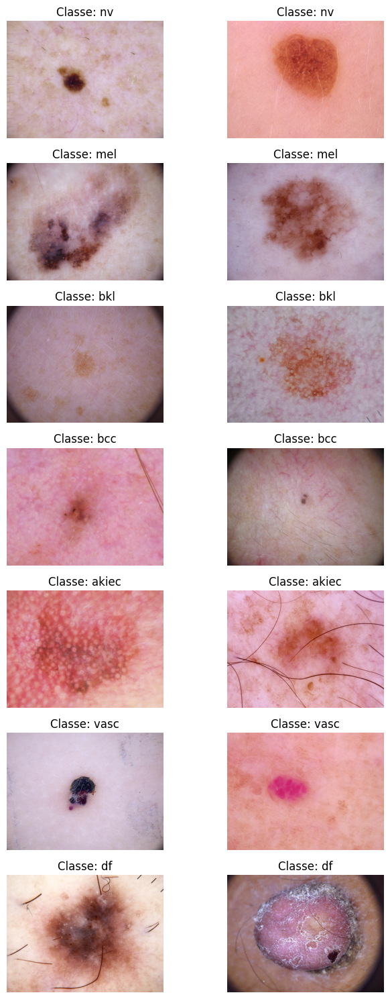

In [ ]:
# affiche quelques image pour chaque classe dans un tableau

import matplotlib.pyplot as plt

# Nombre d'images à afficher par classe
nbr_images = 2

# Créer une figure et des sous-graphiques
fig, axes = plt.subplots(len(class_counts), nbr_images, figsize=(7.5, 15)) # ligen , nbr collone , size

# Parcourir chaque classe
for i, (label, count) in enumerate(class_counts.items()):
    # Sélectionner les images de la classe actuelle
    class_images = df[df['label'] == label].sample(n=min(nbr_images, count))

    # Afficher chaque image dans la classe actuelle
    for j, (_, row) in enumerate(class_images.iterrows()):
        img = Image.open(row['path'])
        axes[i, j].imshow(img)
        axes[i, j].set_title(f"Classe: {label}")         #titres images
        axes[i, j].axis('off')                       # enleve axe

# Ajuster la disposition des sous-graphiques
plt.tight_layout()
plt.show()


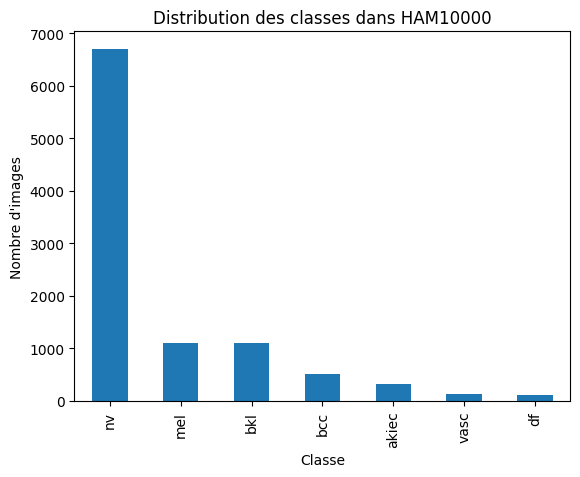

In [ ]:
import matplotlib.pyplot as plt

# Bar plot de la distribution des classes
class_counts.plot(kind='bar')
plt.title("Distribution des classes dans HAM10000")
plt.xlabel("Classe")
plt.ylabel("Nombre d'images")
plt.show()


## separation test , train and valid data set

In [ ]:
from sklearn.model_selection import train_test_split

# Séparation en jeu de train+val et jeu de test (10% des données pour le test)
train_val_df, test_df = train_test_split(df, test_size=0.10, stratify=df['label'], random_state=42)
# Séparation du train+val en train et val (10% de l'original pour validation, soit ~11% de train_val)
train_df, val_df = train_test_split(train_val_df, test_size=0.111, stratify=train_val_df['label'], random_state=42)

print(f"Taille train : {len(train_df)}")
print(f"Taille validation : {len(val_df)}")
print(f"Taille test : {len(test_df)}")

# Vérifier la distribution des classes dans chaque ensemble
print("\nDistribution des classes dans l'ensemble d'entraînement :")
print(train_df['label'].value_counts(normalize=True))
print("\nDistribution des classes dans l'ensemble de validation :")
print(val_df['label'].value_counts(normalize=True))
print("\nDistribution des classes dans l'ensemble de test :")
print(test_df['label'].value_counts(normalize=True))


Taille train : 8012
Taille validation : 1001
Taille test : 1002

Distribution des classes dans l'ensemble d'entraînement :
label
nv       0.669496
mel      0.111208
bkl      0.109710
bcc      0.051423
akiec    0.032576
vasc     0.014229
df       0.011358
Name: proportion, dtype: float64

Distribution des classes dans l'ensemble de validation :
label
nv       0.669331
mel      0.110889
bkl      0.109890
bcc      0.050949
akiec    0.032967
vasc     0.013986
df       0.011988
Name: proportion, dtype: float64

Distribution des classes dans l'ensemble de test :
label
nv       0.669661
mel      0.110778
bkl      0.109780
bcc      0.050898
akiec    0.032934
vasc     0.013972
df       0.011976
Name: proportion, dtype: float64


---

## Préparation du jeu de donnée


Créer 3 générateurs : train_generator, val_generator, test_generator pour que ton modèle CNN reçoive :

1. des batches d’images (X) avec leurs étiquettes (y)

2. des images prétraitées + augmentées (pour le train uniquement)

3. directement depuis un DataFrame contenant les chemins et labels


❗ L’augmentation ne crée pas de nouvelles images enregistrées sur disque.
Elle agit dynamiquement, à chaque époque, pendant que le modèle lit les images.

Avec ImageDataGenerator, à chaque époque d’entraînement, il génère une version modifiée à la volée de chaque image :








In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator      # appliquer des transformations (rotation, zoom…)
from tensorflow.keras.applications.efficientnet import preprocess_input  # bon format bon efficientnet

'''
Variable initales generateurs
'''

# Définir la taille d'entrée des images et la taille de batch
IMG_SIZE = 224
BATCH_SIZE = 32  # L'entraînement se fera en lots (batches) de 32 images => taille du batch impact sur la saturation !


#  TRAIN DATA GENeration : variable utilisé dans Générateur pour les images d'entraînement avec augmentation
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,  # normalisation adaptée à EfficientNet
    rotation_range=20,       # rotation aléatoire jusqu'à 20°
    width_shift_range=0.1,   # décalage horizontal jusqu'à 10% de l'image
    height_shift_range=0.1,  # décalage vertical jusqu'à 10%
    zoom_range=0.1,          # zoom avant/arrière de 10%
    horizontal_flip=True,    # retournement horizontal
    vertical_flip=True       # retournement vertical
)

# VAL/TEST DATA GEN : Générateurs pour validation et test (Même prétraitement que pour l'entraînement (important pour cohérence !), mais sans altérer les images.NE PAS faire d'augmentation pour validation et test . Ces ensembles servent à mesurer la performance réelle du modèle

val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

#AUTRES paramètres communs pour les generateurs  ( size en sortie et couleur et batch size )
common_args = dict(target_size=(IMG_SIZE, IMG_SIZE),
                   color_mode='rgb',
                   batch_size=BATCH_SIZE)


'''
creer les generateur à rentrer lors du model => generaton
'''


# Préparer le générateur d'entraînement
train_generator = train_datagen.flow_from_dataframe(
    train_df,
    x_col='path',  # chemin des fichiers image
    y_col='label',  # label de l'image
    classes=list(train_df['label'].unique()),  # liste des classes à partir des données d'entraînement
    class_mode='categorical',  # pour 7 classes (one-hot encodé)
    shuffle=True, # les mélange
    **common_args
)

# Générateur de validation
val_generator = val_datagen.flow_from_dataframe(
    val_df,
    x_col='path',
    y_col='label',
    classes=list(train_df['label'].unique()),  # mêmes classes que train
    class_mode='categorical',
    shuffle=False,  # shuffle=False pour faciliter l'analyse (on ne mélange pas l'ordre des validations)
    **common_args
)

# Générateur de test
test_generator = test_datagen.flow_from_dataframe(
    test_df,
    x_col='path',
    y_col='label',
    classes=list(train_df['label'].unique()),  # s'assurer d'utiliser le même ordre de classes
    class_mode='categorical',
    shuffle=False,
    **common_args
)


Found 8012 validated image filenames belonging to 7 classes.
Found 1001 validated image filenames belonging to 7 classes.
Found 1002 validated image filenames belonging to 7 classes.


## Création du model


Créer un modèle de classification d’images (7 classes) à partir de EfficientNetB0 (un modèle puissant pré-entraîné sur ImageNet)




Quand on dit que l’on charge EfficientNetB0 sans la tête, cela signifie qu’on utilise uniquement la partie convolutionnelle du modèle – c’est-à-dire le corps du réseau (aussi appelé "backbone"). Par défaut, EfficientNetB0 est conçu pour la classification d’images sur le dataset ImageNet, avec 1000 classes. Sa tête standard se compose d’un GlobalAveragePooling suivi d’une couche Dense(1000) avec une activation softmax. Or, dans notre cas, nous ne voulons pas prédire 1000 classes, mais 7 classes correspondant à des lésions cutanées. C’est pourquoi on précise include_top=False lors du chargement : cela supprime la tête d’origine, tout en conservant les poids pré-entraînés utiles pour l’extraction de caractéristiques visuelles.

Ensuite, on ajoute notre propre tête de classification, adaptée à notre tâche : une couche de global average pooling pour compacter les cartes de caractéristiques, un dropout pour éviter le surapprentissage, puis une couche Dense avec 7 neurones et softmax pour produire les probabilités de chaque classe. Cette approche permet de bénéficier de la puissance d’EfficientNetB0 sans entraîner tout le modèle depuis zéro, en ne modifiant que la partie finale.









In [ ]:
import tensorflow.keras as keras
from tensorflow.keras import layers
from tensorflow.keras.applications import EfficientNetB0

NUM_CLASSES = 7

# Charger le modèle de base EfficientNetB0 pré-entraîné / extraire des caractéristiques visuelles puissantes sans apprendre de zéro.

base_model = EfficientNetB0(weights='imagenet',          # Charge les poids pré-entraînés sur le dataset ImageNet
                            include_top=False,          # on include pas le top ( include la tête= False ) voir ci-dessus
                            input_shape=(IMG_SIZE, IMG_SIZE, 3))   # Accepte des images couleur 224x224
base_model.trainable = False  # BASE DU MODEL NON TRAINABLE => Geler les poids du modèle de base Cela signifie que pendant le TRAIN : Les couches EfficientNet ne seront pas modifiées, Seule ta tête personnalisée (en haut) sera entraînée



# Définir la tête de classification
'''
Créer l’architecture complète du modèle à partir :

- d’une image d’entrée RGB (224x224)

- de la base EfficientNetB0

- d’une tête personnalisée qui donne des probabilités pour 7 classes

'''


inputs = keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))   # Point d’entrée du modèle, une image RGB 224x224
x = base_model(inputs, training=False)        # passe l'image à travers les bases de EfficientNet sans ajuster poids
x = layers.GlobalAveragePooling2D()(x)        # global average pooling pour réduire les features 2D à1D
x = layers.Dropout(0.5)(x)                    # dropout pour régularisation (50%) Désactive 50% des neurones → aide à éviter l'overfitting
outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)  # couche finale à 7 neurones (1 par classe) => SOFTMAX pour avoir des proba

model = keras.Model(inputs, outputs)

# Afficher la structure du modèle
model.summary()


16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetb0 (Functional)          │ (None, 7, 7, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 7)                   │           8,967 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,058,538 (15.48 MB)

 Trainable params: 8,967 (35.03 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

x est une variable temporaire qui représente l’état de l’image (ou plus exactement de ses caractéristiques) à chaque étape du modèle.

Tu peux la voir comme un flux de données (les "features") qui passe de couche en couche, en subissant des transformations successives jusqu’à la sortie finale.

Input Image  →  EfficientNetB0 → GlobalAveragePooling → Dropout → Dense(7, softmax)

  (224x224x3) →   (7x7x1280)     →     (1280)          → (1280)  →   (7 proba)

       ↓                    ↓                    ↓               ↓
       
     x à chaque étape      ↳ features         ↳ régularisés     ↳ sortie finale


In [ ]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard     # EarlyStopping	Arrêter l’entraînement si le modèle stagne //// ModelCheckpoint	Sauvegarder le meilleur modèle (fichier .h5) //// TensorBoard	Créer des logs pour visualisation des performances
import datetime

# Compiler le modèle (phase 1, base gelée)
model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-3),   # Optimizer = Adam :	Algo qui ajuste les poids automatiquement (~ descnte de gradient  ) // learning rate "pas" lors de l'algo
              loss='categorical_crossentropy',                       # mesure l’erreur (  classification )
              metrics=['accuracy'])                                   # précision

# Préparer les callbacks (voir en bas texte )
callbacks = []

# EarlyStopping pour arrêter si le val_loss ne s'améliore plus pendant 3 epochs
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)  #Restore_best_weights = garde les meilleurs poids trouvés
callbacks.append(early_stop)

# ModelCheckpoint pour sauvegarder le meilleur modèle basé sur val_accuracy
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_accuracy', save_best_only=True, verbose=1) # Fichier produit : best_model.h5
callbacks.append(checkpoint)

# TensorBoard callback pour logs et la visualisation
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")   # enrgistre le moment et à chaque epoch les caracteristique du model
tensorboard_cb = TensorBoard(log_dir=log_dir, histogram_freq=1)
callbacks.append(tensorboard_cb)

# Lance l'entraînement phase 1 - seules les dernières couches sont entraînables (base_model est gelé)
initial_epochs = 5
history1 = model.fit(
    train_generator,
    epochs=initial_epochs,
    validation_data=val_generator,
    callbacks=callbacks
)


Epoch 1/5
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 697ms/step - accuracy: 0.6845 - loss: 0.8770
Epoch 1: val_accuracy improved from -inf to 0.69630, saving model to best_model.h5


251/251 ━━━━━━━━━━━━━━━━━━━━ 225s 808ms/step - accuracy: 0.6845 - loss: 0.8769 - val_accuracy: 0.6963 - val_loss: 0.7823
Epoch 2/5
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 617ms/step - accuracy: 0.7173 - loss: 0.7929
Epoch 2: val_accuracy improved from 0.69630 to 0.72128, saving model to best_model.h5


251/251 ━━━━━━━━━━━━━━━━━━━━ 166s 661ms/step - accuracy: 0.7173 - loss: 0.7929 - val_accuracy: 0.7213 - val_loss: 0.7286
Epoch 3/5
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 624ms/step - accuracy: 0.7175 - loss: 0.7755
Epoch 3: val_accuracy did not improve from 0.72128
251/251 ━━━━━━━━━━━━━━━━━━━━ 205s 672ms/step - accuracy: 0.7175 - loss: 0.7754 - val_accuracy: 0.7203 - val_loss: 0.7121
Epoch 4/5
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 637ms/step - accuracy: 0.7358 - loss: 0.7341
Epoch 4: val_accuracy improved from 0.72128 to 0.73526, saving model to best_model.h5


251/251 ━━━━━━━━━━━━━━━━━━━━ 173s 688ms/step - accuracy: 0.7357 - loss: 0.7341 - val_accuracy: 0.7353 - val_loss: 0.6852
Epoch 5/5
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 640ms/step - accuracy: 0.7204 - loss: 0.7482
Epoch 5: val_accuracy did not improve from 0.73526
251/251 ━━━━━━━━━━━━━━━━━━━━ 204s 689ms/step - accuracy: 0.7205 - loss: 0.7481 - val_accuracy: 0.7273 - val_loss: 0.6821


Un **callback dans TensorFlow** est un outil qui permet d’automatiser certaines actions pendant l’entraînement d’un modèle. Il agit comme un observateur qui surveille les performances du modèle à chaque epoch et réagit en fonction de critères définis. Par exemple, ici, une liste vide callbacks = [] est d’abord créée pour stocker les différents callbacks utilisés. Ensuite, plusieurs callbacks sont ajoutés à cette liste : EarlyStopping qui arrête automatiquement l’entraînement si la performance sur les données de validation ne s’améliore plus après 3 epochs, ModelCheckpoint qui sauvegarde automatiquement les meilleurs poids du modèle dans un fichier dès que la précision de validation progresse, et TensorBoard qui enregistre les informations d’entraînement (pertes, précisions) dans un dossier de log. Lorsqu’on exécute model.fit(...), cette liste de callbacks est passée en paramètre et Keras applique automatiquement leurs fonctions à chaque epoch pour rendre l’entraînement plus intelligent et optimisé.









In [ ]:
%load_ext tensorboard # permet d’activer TensorBoard directement dans ton notebook, sans ouvrir une autre page ou une autre interface.



Le bloc de code lié à TensorBoard (voir en haut : log_dir =  .... ) permet d’enregistrer automatiquement les performances du modèle (accuracy, loss, etc.) à chaque epoch dans un dossier de logs. Ces informations peuvent ensuite être visualisées facilement avec la commande `%tensorboard --logdir logs/fit`, offrant des courbes claires, interactives et un suivi propre de l’entraînement. Cependant, l’utilisation de TensorBoard n’est pas indispensable pour faire fonctionner le modèle. On peut tout à fait tracer manuellement les courbes de performance avec matplotlib, mais cela demande plus de travail, plus de code, et les visualisations sont moins interactives et moins professionnelles que celles offertes automatiquement par TensorBoard.

In [ ]:
%tensorboard --logdir logs/fit


<IPython.core.display.Javascript object>

In [ ]:
# Phase 2: Fine-tuning - dégeler le modèle de base et recompiler avec LR plus petit
base_model.trainable = True  # on dégele tout EfficientNetB0

# On peut éventuellement imprimer le nombre de couches pour info
print("Nombre de couches dans le modèle de base :", len(base_model.layers))

# Recompiler avec un petit learning rate pour fine-tuning
model.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-4),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Poursuivre l'entraînement (quelques epochs de plus)
fine_tune_epochs = 5
total_epochs = initial_epochs + fine_tune_epochs

history2 = model.fit(
    train_generator,
    epochs=total_epochs,
    initial_epoch=history1.epoch[-1] + 1,  # reprend le comptage d'epoch où on s'était arrêté
    validation_data=val_generator,
    callbacks=callbacks
)


Nombre de couches dans le modèle de base : 238
Epoch 6/10
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 826ms/step - accuracy: 0.7339 - loss: 0.7700
Epoch 6: val_accuracy improved from 0.73526 to 0.78322, saving model to best_model.h5


251/251 ━━━━━━━━━━━━━━━━━━━━ 315s 927ms/step - accuracy: 0.7340 - loss: 0.7696 - val_accuracy: 0.7832 - val_loss: 0.5628
Epoch 7/10
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 657ms/step - accuracy: 0.8050 - loss: 0.5387
Epoch 7: val_accuracy improved from 0.78322 to 0.78521, saving model to best_model.h5


251/251 ━━━━━━━━━━━━━━━━━━━━ 177s 706ms/step - accuracy: 0.8050 - loss: 0.5387 - val_accuracy: 0.7852 - val_loss: 0.5719
Epoch 8/10
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 648ms/step - accuracy: 0.8417 - loss: 0.4411
Epoch 8: val_accuracy improved from 0.78521 to 0.80619, saving model to best_model.h5


251/251 ━━━━━━━━━━━━━━━━━━━━ 175s 699ms/step - accuracy: 0.8417 - loss: 0.4412 - val_accuracy: 0.8062 - val_loss: 0.5615
Epoch 9/10
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 650ms/step - accuracy: 0.8563 - loss: 0.3993
Epoch 9: val_accuracy did not improve from 0.80619
251/251 ━━━━━━━━━━━━━━━━━━━━ 175s 696ms/step - accuracy: 0.8563 - loss: 0.3993 - val_accuracy: 0.7962 - val_loss: 0.5933
Epoch 10/10
251/251 ━━━━━━━━━━━━━━━━━━━━ 0s 658ms/step - accuracy: 0.8691 - loss: 0.3548
Epoch 10: val_accuracy did not improve from 0.80619
251/251 ━━━━━━━━━━━━━━━━━━━━ 176s 703ms/step - accuracy: 0.8691 - loss: 0.3548 - val_accuracy: 0.8052 - val_loss: 0.5840


In [ ]:
# Optionnel: Charger le meilleur modèle sauvegardé (au cas où l'early stopping l'ait arrêté avant la fin)
best_model = keras.models.load_model('best_model.h5')


### evaluation du model

In [ ]:
# Évaluer le modèle sur le jeu de test
loss, accuracy = model.evaluate(test_generator)
print(f"Performance sur le test - Loss : {loss:.4f} , Accuracy : {accuracy:.4f}")


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


32/32 ━━━━━━━━━━━━━━━━━━━━ 19s 589ms/step - accuracy: 0.8110 - loss: 0.5458
Performance sur le test - Loss : 0.5549 , Accuracy : 0.8094


In [ ]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

# Obtenir les prédictions du modèle sur le test (probabilités pour chaque classe)
y_proba = model.predict(test_generator)
y_pred = np.argmax(y_proba, axis=1)  # classes prédites (indice de la probabilité max)
y_true = test_generator.classes      # vraies classes (indices numériques) alignées avec test_generator

# Extraire le nom des classes dans le bon ordre
class_indices = test_generator.class_indices   # dict {class_name: index}
# Inverser le mapping pour avoir index->class_name
idx_to_class = {v: k for k, v in class_indices.items()}
class_names = [idx_to_class[i] for i in range(NUM_CLASSES)]

# Matrice de confusion
cm = confusion_matrix(y_true, y_pred)
print("Matrice de confusion (lignes = vérités, colonnes = prédictions) :")
print(cm)

# Afficher la matrice de confusion sous forme d'un DataFrame pour lisibilité (avec labels)
cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)
cm_df


32/32 ━━━━━━━━━━━━━━━━━━━━ 11s 341ms/step
Matrice de confusion (lignes = vérités, colonnes = prédictions) :
[[ 78  18  12   0   0   0   2]
 [  8 623  36   2   2   0   0]
 [ 14  36  61   0   0   0   0]
 [  1   1   2  10   0   0   0]
 [ 10   6   6   1  28   0   0]
 [  8   1  17   0   1   5   1]
 [  3   3   0   0   0   0   6]]


,bkl,nv,mel,vasc,bcc,akiec,df
bkl,78,18,12,0,0,0,2
nv,8,623,36,2,2,0,0
mel,14,36,61,0,0,0,0
vasc,1,1,2,10,0,0,0
bcc,10,6,6,1,28,0,0
akiec,8,1,17,0,1,5,1
df,3,3,0,0,0,0,6


Matrice de confusion en pourcentage (% par classe réelle) :
        bkl    nv   mel  vasc   bcc  akiec    df
bkl    70.9  16.4  10.9   0.0   0.0    0.0   1.8
nv      1.2  92.8   5.4   0.3   0.3    0.0   0.0
mel    12.6  32.4  55.0   0.0   0.0    0.0   0.0
vasc    7.1   7.1  14.3  71.4   0.0    0.0   0.0
bcc    19.6  11.8  11.8   2.0  54.9    0.0   0.0
akiec  24.2   3.0  51.5   0.0   3.0   15.2   3.0
df     25.0  25.0   0.0   0.0   0.0    0.0  50.0


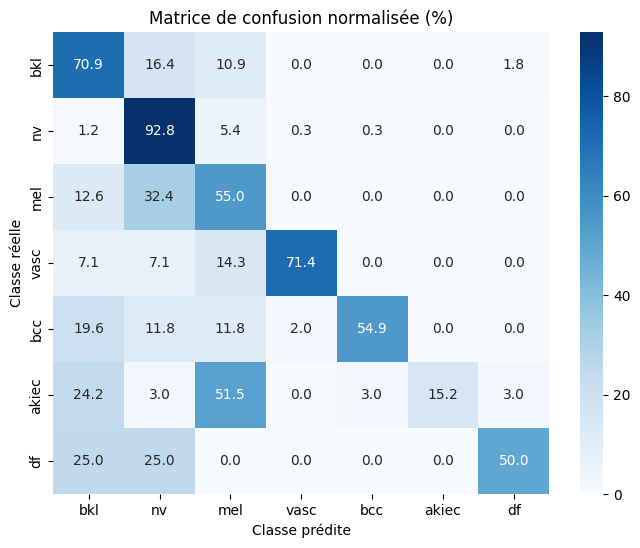

In [ ]:
# Matrice de confusion normalisée par lignes (pour voir les % d'erreurs par classe réelle)
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
cm_norm_df = pd.DataFrame(np.round(cm_norm*100,1), index=class_names, columns=class_names)
print("Matrice de confusion en pourcentage (% par classe réelle) :")
print(cm_norm_df)

# Visualisation avec seaborn heatmap
import seaborn as sns
plt.figure(figsize=(8,6))
sns.heatmap(cm_norm_df, annot=True, fmt='.1f', cmap='Blues')
plt.title("Matrice de confusion normalisée (%)")
plt.ylabel("Classe réelle")
plt.xlabel("Classe prédite")
plt.show()


In [ ]:
# Rapport de classification
report = classification_report(y_true, y_pred, target_names=class_names)
print("Rapport de classification :")
print(report)


Rapport de classification :
              precision    recall  f1-score   support

         bkl       0.64      0.71      0.67       110
          nv       0.91      0.93      0.92       671
         mel       0.46      0.55      0.50       111
        vasc       0.77      0.71      0.74        14
         bcc       0.90      0.55      0.68        51
       akiec       1.00      0.15      0.26        33
          df       0.67      0.50      0.57        12

    accuracy                           0.81      1002
   macro avg       0.76      0.59      0.62      1002
weighted avg       0.82      0.81      0.80      1002



Content des résultats , mais large désequilibre car HAM10000 est vrmt tres desequilibré ( idem pour autres code vu sur kagggle )


In [ ]:
model.save("skin_lesion_classifier_model.h5")


1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step


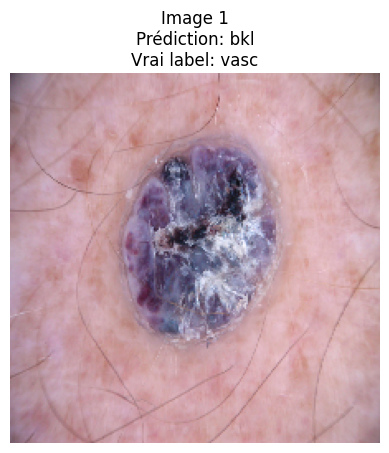

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


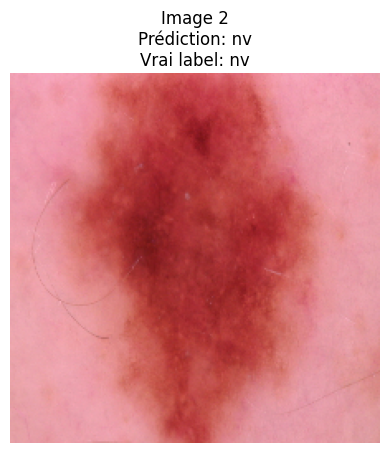

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


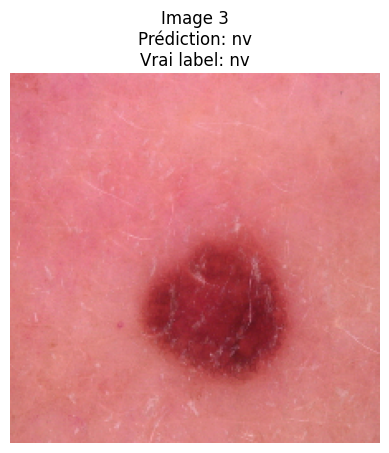

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


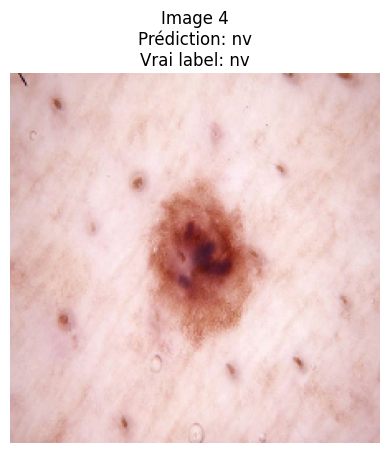

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


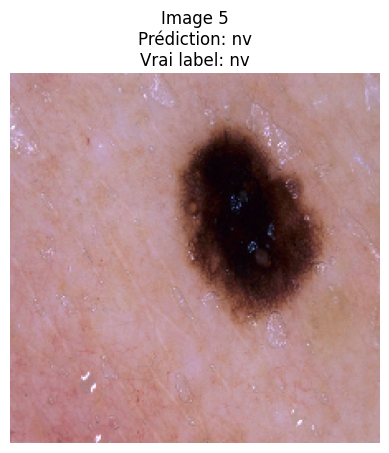

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


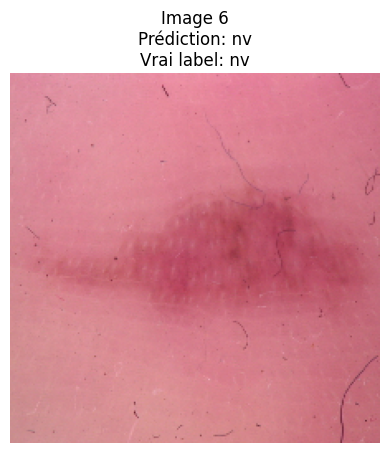

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


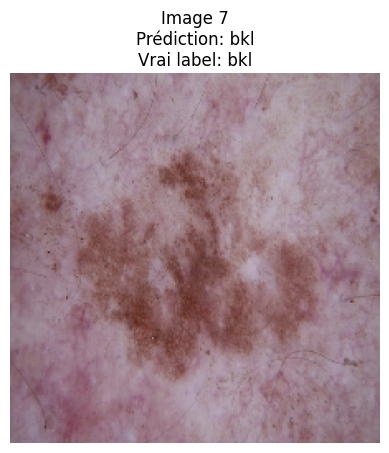

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


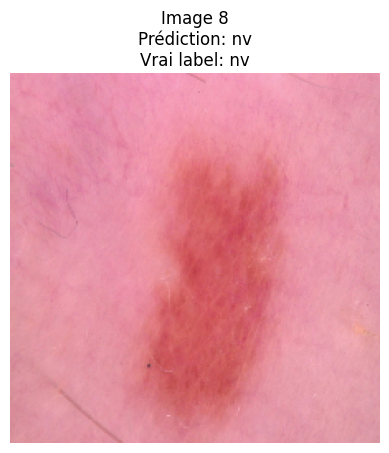

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


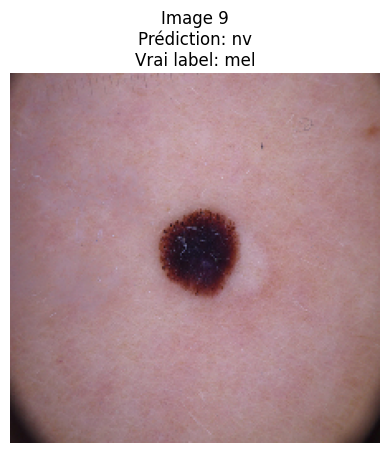

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


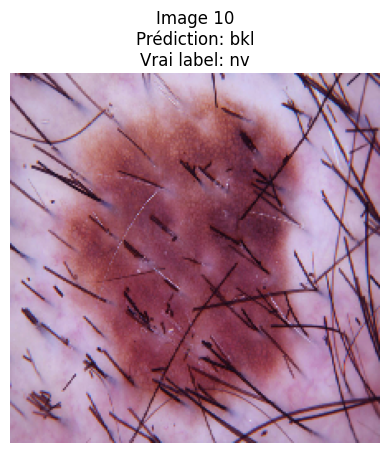

In [ ]:
# prompt: ecris du code pour tester le model sur 3 images tests ainsi que les afficher et afficher la prediction à coté de chaque image ainsi que le vrai label

import matplotlib.pyplot as plt
import numpy as np

# Charger le modèle sauvegardé
model = keras.models.load_model('skin_lesion_classifier_model.h5')

# Choisir 3 images aléatoires du jeu de test
test_image_indices = np.random.choice(len(test_df), size=10, replace=False)
test_images = [test_df.iloc[i] for i in test_image_indices]


# Prédire et afficher
for i, image_info in enumerate(test_images):
    image_path = image_info['path']
    true_label = image_info['label']
    img = load_img(image_path, target_size=(IMG_SIZE, IMG_SIZE))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array) # Assurez-vous que le prétraitement est correct

    prediction = model.predict(img_array)
    predicted_class_index = np.argmax(prediction)
    predicted_label = idx_to_class[predicted_class_index] # Utiliser idx_to_class ici

    plt.figure()
    plt.imshow(img)
    plt.title(f"Image {i+1}\nPrédiction: {predicted_label}\nVrai label: {true_label}")
    plt.axis('off')
    plt.show()
